In [7]:
# Code to generate Figures 4f and 4g as well as 

In [8]:
from hsi_detect.utils import *
import plotly.express as px

from datetime import date
today = date.today()
date_str = today.strftime('%d%b%Y')
print ('Date prefix:', date_str)


import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['lines.linewidth'] = 0.5
mpl.rcParams['axes.linewidth']= 0.5
mpl.rcParams['xtick.major.width'] = 0.5
mpl.rcParams['xtick.minor.width'] = 0.5
mpl.rcParams['ytick.major.width'] = 0.5
mpl.rcParams['ytick.minor.width'] = 0.5
plt.rcParams['font.sans-serif'] = 'Arial'
plt.rcParams['font.size'] = 7

Date prefix: 19Aug2024


In [24]:
IMAGE_PATH = '00_data/uav_flight_hsi/raw_0_rd_rf_or.hdr'
CONC_MAP_PATH = '00_data/uav_flight_hsi/plates_col1_labels.csv'
REFERENCE_SPECTRUM_PATH = '00_data/absorbance_data/YF10_infered_absorbance_from_pellets_09Jul2024.npy'

savedir = '/'.join(IMAGE_PATH.split('/')[:-1])+f'{IMAGE_PATH.split("/")[-1].split(".hdr")[0]}_outputs_from_analysis/'

print (savedir)
if not os.path.isdir(savedir):
    os.mkdir(savedir)
    print ('Made directory:', savedir)

00_data/uav_flight_hsiraw_0_rd_rf_or_outputs_from_analysis/


/var/folders/cb/fq3bwnj51bv2d7d694kx77pm0000gp/T/ipykernel_13696/3136813933.py:7: RuntimeWarning: invalid value encountered in true_divide
  img = unnormalized_img / np.nanmax(unnormalized_img, axis=2, keepdims=True)


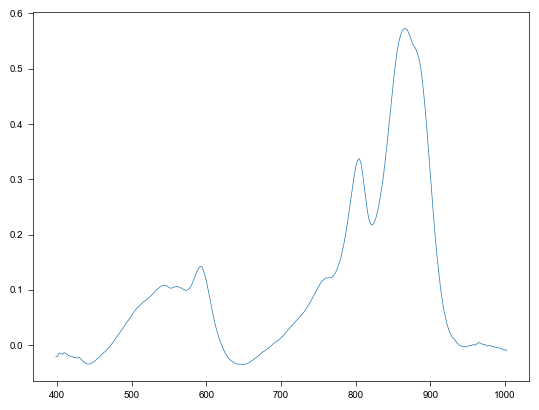

In [10]:
# Open image 
lib = envi.open(IMAGE_PATH)
centers = lib.bands.centers
unnormalized_img = smooth_img_spectrum(open_image(IMAGE_PATH).load(), window_size=11)

# Normalize image
img = unnormalized_img / np.nanmax(unnormalized_img, axis=2, keepdims=True)

# Load absorbance data
reference_file = np.load(REFERENCE_SPECTRUM_PATH)

reference_wls = reference_file[0,:]
reference_spec = reference_file[1,:]

reference_spec = np.interp(centers, reference_wls, reference_spec)
plt.figure()
plt.plot(centers, reference_spec)
plt.show()

(1220, 682, 3) (1220, 682, 1)


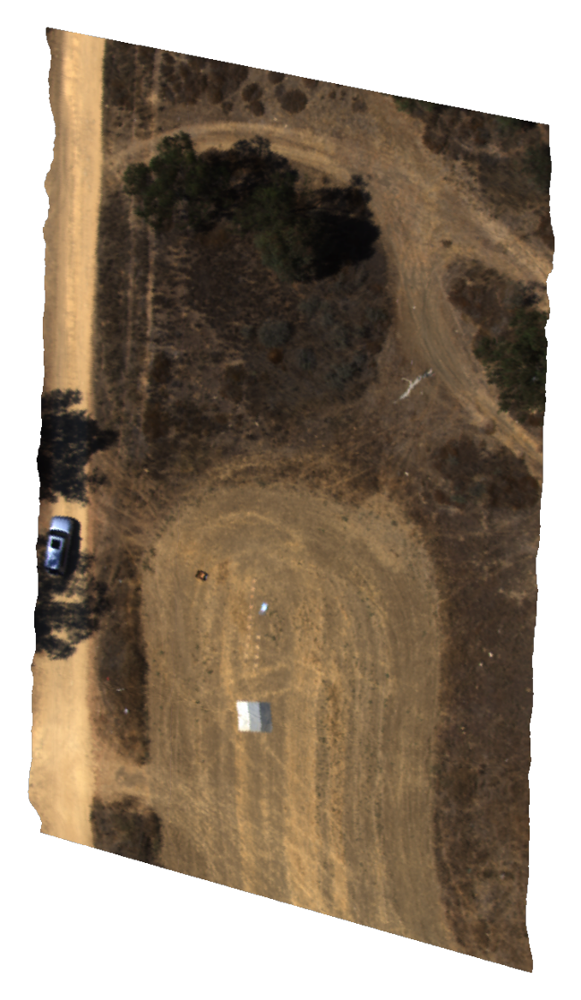

In [11]:
# visualize image
whole_rgb = bandpass_rgb_function(unnormalized_img, centers, coeffs=[1.8,1.8,1.8]).astype(np.float64)

alpha_layer = ((1-np.isnan(img[:,:,0]))[:,:,np.newaxis]*255).astype(int)
print(whole_rgb.shape, alpha_layer.shape)
whole_rgb = np.concatenate([whole_rgb, alpha_layer], axis=2).astype(int)


plt.figure(dpi=300)
plt.imshow(whole_rgb)

plt.box(False)
plt.xticks([])
plt.yticks([])
plt.savefig(savedir+f'{date_str}_reconstructed_RGB.png', dpi=300, transparent=True)
plt.show()

In [33]:
### Perform image classification
from joblib import cpu_count
from sklearn.cluster import Kmeans
# flatten image
img_flattened= np.reshape(img, (img.shape[0]*img.shape[1], img.shape[2]))

# normalize image
img_flattened = img_flattened / np.nanmax(img_flattened, axis=1, keepdims=True)

# extract endmembers using kmeans followed by hierarchical clustering
em_ls, clust_ls = kmeans_hierarchical_extract_endmembers(img, return_cluster_idxs=True, 
                                                             reference_spec=reference_spec, 
                                                             reduced_dims=3,
                                                             filter_threshold=0.9, clustering_method=KMeans)

# score image using reference spectrum and extracted endmembers
mat = np.vstack([-reference_spec, em_ls[0]])
scored_img = UCLS(img_flattened, mat)
scored_img = np.reshape(scored_img[:,0], img.shape[:2])

# threshold score
scored_img[scored_img<0] = 0

/var/folders/cb/fq3bwnj51bv2d7d694kx77pm0000gp/T/ipykernel_13696/756076362.py:7: RuntimeWarning:

All-NaN slice encountered

/Users/Itai/Library/Mobile Documents/com~apple~CloudDocs/from_box/Grad/research/bioHSI/04_image_processing/hsi_detect/utils.py:505: RuntimeWarning:

All-NaN slice encountered



Before filtering: 1000 endmembers
After filtering: 1000 endmembers


17 endmembers extracted


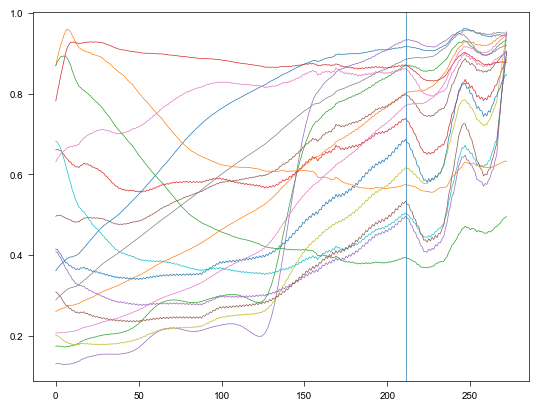

In [34]:
# visualize endmembers 

print (len(em_ls[0]), 'endmembers extracted')
for s in em_ls[0]:
    plt.plot(s)
plt.axvline(np.argmax(reference_spec))

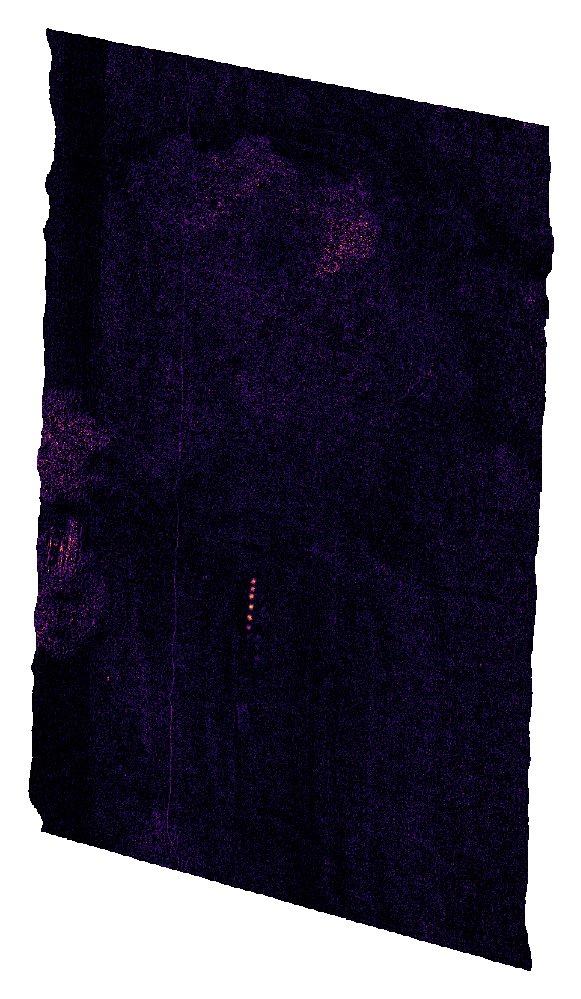

In [35]:
# Visualize classified image

plt.figure(dpi=500)
plt.imshow(scored_img, vmin=0, vmax=0.4, cmap='inferno')
plt.xticks([])
plt.yticks([])
plt.box(False)
plt.show()

In [36]:
import json
if os.path.exists(f'{savedir}/manually_defined_rectangle_coordinates.json'):
    with open(f'{savedir}/manually_defined_rectangle_coordinates.json', 'r') as f:
        coords = json.load(f)
        rectangle_tls = coords['TL']
        rectangle_brs = coords['BR']
    print ('Loaded!')


Loaded!


In [37]:
if not os.path.exists(f'{savedir}/manually_defined_rectangle_coordinates.json'):
    GET_RGB_FROM_HSI = False
    from dash import Dash, dcc, html, Input, Output, callback
    cmap = plt.get_cmap('tab20')

    external_stylesheets = ['https://codepen.io/chriddyp/pen/bWLwgP.css']

    app = Dash(__name__, external_stylesheets=external_stylesheets)
    rgb = whole_rgb
    ##DONT CROP
    window_to_show = [[0,np.max(rgb.shape[0])],[0,np.max(rgb.shape[1])]]
    ##

    if GET_RGB_FROM_HSI:
        fig = px.imshow((220*rgb[window_to_show[0][0]:window_to_show[0][1], 
                           window_to_show[1][0]:window_to_show[1][1]]).astype(dtype=np.uint8))
    else:
        
        fig = px.imshow((254*rgb[window_to_show[0][0]:window_to_show[0][1], 
                           window_to_show[1][0]:window_to_show[1][1]]).astype(dtype=np.uint8))
    rectangle_tls = []
    rectangle_trs = []
    rectangle_brs = []
    rectangle_bls = []
    COUNT= 0
    im_id = 0
    ls = []

    styles = {
        'pre': {
            'border': 'thin lightgrey solid',
            'overflowX': 'scroll'
        }
    }

    app.layout = html.Div([ 
        html.Div([dcc.Graph(id='img',figure=fig)]),
        html.Div(
            [
                dcc.Markdown("Top Left"),
                html.Pre(id='tl', style=styles['pre'])
            ],
        className='two columns'
        ),
        html.Div(
            [
                dcc.Markdown("Bottom Right"),
                html.Pre(id='br', style=styles['pre'])
            ],
        className='two columns'
        ),

    ])


    COUNT = 0
    SELECTED = []
    @callback(
        Output('tl', 'children'),
        Output('br', 'children'),
        Input('img', 'clickData'),
        Input('img', 'figure')
    )
    def onclick_x(clickData, fig):
        global rectangle_tls, rectangle_brs, COUNT, im_id, l    
        if clickData is not None:
            x= int(clickData['points'][0]['x'])
            y= int(clickData['points'][0]['y'])
            adj_x = x+window_to_show[1][0] 
            adj_y = y+window_to_show[0][0]
            if COUNT % 2 == 0:
                rectangle_tls.append([adj_y,adj_x])
                SELECTED.append([adj_y,adj_x])
                COUNT+=1
            elif COUNT % 2 == 1:
                rectangle_brs.append([adj_y,adj_x])
                SELECTED.append([adj_y,adj_x])
                COUNT+=1

        else:
            pass




    #     return [str({i:l[i] for i in range(len(l))})for l in [rectangle_tls, rectangle_trs, rectangle_brs,rectangle_bls]]
        return [str({i:l[i] for i in range(len(l))})for l in [rectangle_tls, rectangle_brs]]

    if __name__ == '__main__':
        app.run()
        # app.run(ip, port=np.random.choice(range(8300,8900)), debug=True)

In [38]:
if not os.path.exists(f'{savedir}//manually_defined_rectangle_coordinates.json'):
    with open(f'{savedir}//manually_defined_rectangle_coordinates.json', 'w') as f:
        json.dump({'TL':rectangle_tls,'BR':rectangle_brs},f)

In [39]:

masks = make_rectangle_mask(img.shape, zip(rectangle_tls, rectangle_brs))


spec_fxn = lambda x : np.nanmean(x, axis=(0,1))
mean_spec_ls = apply_function_to_rectangles (img, zip(rectangle_tls, rectangle_brs), spec_fxn)


max_abs_idx = np.argmax(reference_spec)
peak_fxn = lambda x : np.mean(x[:, :, max_abs_idx])
normed_peak_of_interest = apply_function_to_rectangles (img, zip(rectangle_tls, rectangle_brs), peak_fxn)
unnormed_peak_of_interest = apply_function_to_rectangles (img, zip(rectangle_tls, rectangle_brs), peak_fxn)



mean_fxn = lambda x : np.nanmean(x)
# mean_fxn = lambda x : np.nanmean( np.max(np.stack([x, np.zeros_like(x)], axis=1)) )
mean_scores = apply_function_to_rectangles (scored_img, zip(rectangle_tls, rectangle_brs), mean_fxn)


sum_fxn = lambda x : np.nansum(x)
sum_scores = apply_function_to_rectangles (scored_img, zip(rectangle_tls, rectangle_brs), sum_fxn)

conc_map = pd.read_csv(CONC_MAP_PATH, header=None)

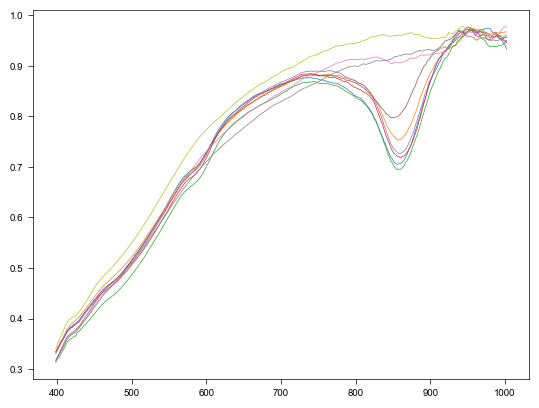

In [40]:
for i in range(len(conc_map)):
    plt.plot(centers,mean_spec_ls[i])

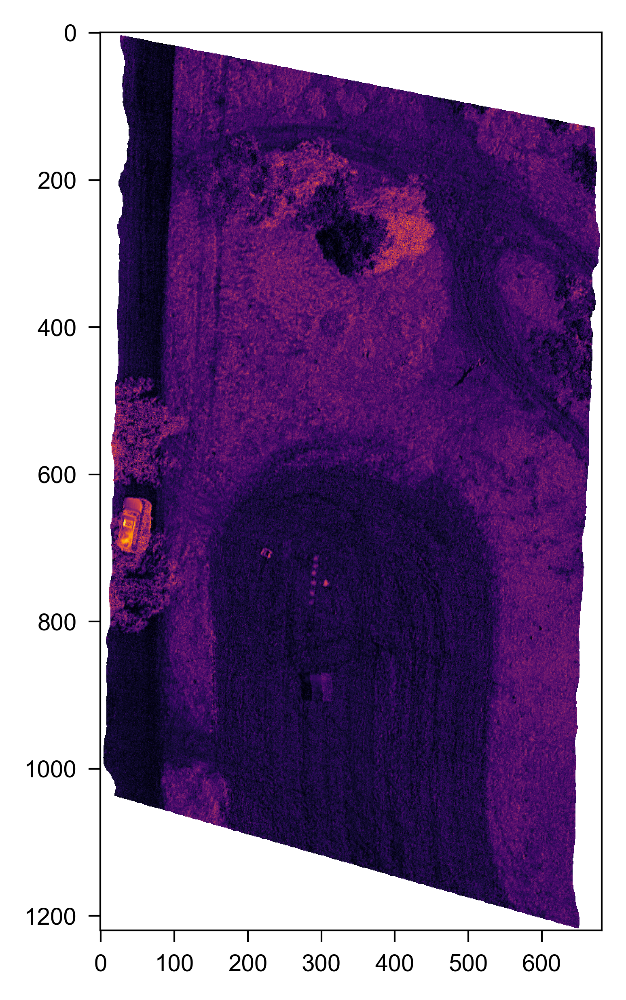

In [41]:
plt.figure(dpi=600)
plt.imshow(img[:,:,max_abs_idx], cmap='inferno_r')
plt.show()

In [42]:
from matplotlib.ticker import LogLocator

In [43]:
def plot_fit_curve (conc, ab, _hill_eqn, xlims, ylims, figname, markersize=13, fit_linewidth=0.5, xlabel='', 
                    ylabel = 'Fraction absorbed', pts = 5000, ymax_bound = 1, ymin_bound=0,
                    line_color = 'black',
                    marker_color='black', edgecolor='black',
                    width_ratios = [1,10], figsize=(1.5,1.5), ylog=False, error=None,
                    additional_concs_to_plot=None, 
                    additional_data_to_plot = None, 
                    additional_data_ylims = None,
                    colors_for_additional_data=None, x_offset=1e-7, yticks=None, fit_lower_bounds=[-np.inf,-np.inf,0,0], 
                    fit_upper_bounds=[np.inf,np.inf,np.inf, np.inf],
                    ignore_for_fit = None
                   ):
    
    
    f, (ax, ax2) = plt.subplots(1, 2, figsize = figsize, sharey=True, gridspec_kw={'width_ratios': width_ratios}, dpi=300)
    try:
        print ('FITTING')
        
        conc_to_fit = conc
        ab_to_fit = ab
        if ignore_for_fit is not None:
            ignore_idxs=np.ones_like(conc).astype(bool)
            ignore_idxs[ignore_for_fit] = False

            conc_to_fit = conc[ignore_idxs]
            ab_to_fit = ab[ignore_idxs]
        
        (ymin, ymax, K, n), pcov = curve_fit(_hill_eqn, 
                                             conc_to_fit, ab_to_fit, 
                                             bounds=(fit_lower_bounds, fit_upper_bounds), 
                                             maxfev=10000)
        xs = np.logspace(*np.log10(xlims), pts)#max([int(xlims[1]*10), pts]))
        ydata = _hill_eqn(xs, ymin, ymax,  K, n)
        print ('DONE FITTING')
        ax2.plot(xs, ydata, color=line_color, clip_on=False, linewidth=fit_linewidth, zorder=0)
#         print ('\n'.join(str(x) for x in (ymax, ymin, K, n)))
        print (f'~~~\nymax:{ymax}\nymin:{ymin}\nK:{K}\nn:{n}\n~~~')
        
        
    except RuntimeError as e:
        print (e)
        pass
    
    conc = np.array(conc)
    
    if error is not None:
        ax.errorbar(np.min(conc), ab[np.argmin(conc)], yerr=[error[np.argmin(conc)]], color='black', linestyle='', linewidth=1, capsize=2)
        ax2.errorbar(conc, ab, yerr=error, capsize=2, color='black', linestyle='', linewidth=1)
    ax.set_xscale('symlog')
    ax2.set_xscale('log')
    
    if ylog:
        ax.set_yscale('symlog')
        ax2.set_yscale('symlog')

    ax.spines['right'].set_visible(False)
    ax2.spines['left'].set_visible(False)
    
    ax2.yaxis.set_visible(False)
    
    linewidth = 0.5
    d = 2.5
    kwargs = dict(marker=[(-1, -d), (1, d)], 
                  markersize=5, 
                  linestyle="none", 
                  color='black', 
                  mec='black', mew=linewidth, clip_on=False)
    
    ax.plot([1.03], [0], transform=ax.transAxes, **kwargs, zorder=100)
    ax2.plot([0], [0], transform=ax2.transAxes, **kwargs, zorder=100)
    

    ax.set_ylabel(ylabel)
    f.text(0.6, 0.01,xlabel, ha='center')
    
    try:
        con = ConnectionPatch(xyA=(0, _hill_eqn(0, ymin, ymax,  K, n)), xyB=(xlims[0], np.min(ydata)), coordsA="data", coordsB="data",
                      axesA=ax, axesB=ax2, color=line_color, linestyle='dotted', linewidth=fit_linewidth,
                        connectionstyle='arc3', patchA=None, patchB=None, shrinkA=0.0, 
                        shrinkB=0.0, mutation_scale=1.0, mutation_aspect=None, clip_on=False, zorder=1)
        f.add_artist(con)
    except:
        pass
    
    main_marker_color = marker_color
    if additional_data_to_plot is not None:
        ax3 = ax.twinx()
        ax4 = ax2.twinx()
        for i, (d, ac) in enumerate(zip(additional_data_to_plot, additional_concs_to_plot)):
            if colors_for_additional_data is not None:
                marker_color = colors_for_additional_data[i]
            ax3.scatter(ac[ac==np.min(ac)], d[ac==np.min(ac)], 
                        c = marker_color, s = markersize/2, clip_on=False, 
                        alpha=1, linewidth=markersize/20, zorder=1, marker='s')
            ax3.yaxis.set_visible(False)
            ax3.set_axis_off()
            ax4.sharey(ax3)
            ax4.scatter(ac, d, c = marker_color, s = markersize/2, clip_on=False, 
                        alpha=1, linewidth=markersize/20, zorder=1, marker='s')
            ax4.set_frame_on(False)
            ax4.set_ylim(*additional_data_ylims)
            
    ax.scatter(conc[conc==np.min(conc)], ab[conc==np.min(conc)], c = main_marker_color, 
               s = markersize, clip_on=False, edgecolor=edgecolor, alpha=1, 
               linewidth=markersize/20, zorder=5)
    ax2.scatter(conc, ab, c = main_marker_color, s = markersize, clip_on=False, 
                edgecolor=edgecolor, alpha=1, linewidth=markersize/20, zorder=10)    
    y_offset = 0.0006

    con2 = ConnectionPatch(xyA=(1, 1 - y_offset), xyB=(0, 1 - y_offset), coordsA='axes fraction', coordsB='axes fraction',
                      axesA=ax, axesB=ax2, color="black", linewidth = linewidth,
                        connectionstyle='arc3', patchA=None, patchB=None, shrinkA=0.0, 
                           shrinkB=0.0, mutation_scale=1.0, mutation_aspect=None, clip_on=False)
    f.add_artist(con2)
    
    ax.set_xticks([0])
    
    if yticks is not None:
        ax.set_yticks(yticks)
    ax.set_xticks([], minor=True)
    x_min_exp = int(np.log10(xlims[0]))
    x_max_exp = int(np.log10(xlims[1]))
    step_size = 1
    minor_step_size = 5
    major_ticks  = np.logspace(x_min_exp-1,x_max_exp+1, int((x_max_exp-x_min_exp)/step_size) + 3, base=10)
    minor_ticks = np.concatenate([np.linspace(major_ticks[i], major_ticks[i+1], minor_step_size+1) for i in range(len(major_ticks)-1)])
    ax.minorticks_on()
    ax2.set_xticks(major_ticks)
    ax2.set_xticks(minor_ticks, minor=True,)
    ax2.tick_params(which='minor', length=1.5, width=0.5)
    ax2.tick_params(which='both', width=0.5)
    ax.set_xlim(0-x_offset*markersize, 1e-5)
    ax.set_xticks([], minor=True)
    ax2.set_xlim(*xlims)
    ax2.set_ylim(*ylims)
    
    f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.08, hspace=None)

    f.savefig(figname, dpi=400)

    plt.show()   

Saved to: 00_data/uav_flight_hsiraw_0_rd_rf_or_outputs_from_analysis//19Aug2024_col1_insitu_RG_classified_hill_plot.pdf
FITTING
DONE FITTING
~~~
ymax:0.26999999999999996
ymin:0.01854188441898341
K:5.244094095529583
n:2.7999999999999994
~~~


/var/folders/cb/fq3bwnj51bv2d7d694kx77pm0000gp/T/ipykernel_13696/250503391.py:103: UserWarning:

All values for SymLogScale are below linthresh, making it effectively linear. You likely should lower the value of linthresh. 

/var/folders/cb/fq3bwnj51bv2d7d694kx77pm0000gp/T/ipykernel_13696/250503391.py:106: UserWarning:

All values for SymLogScale are below linthresh, making it effectively linear. You likely should lower the value of linthresh. 



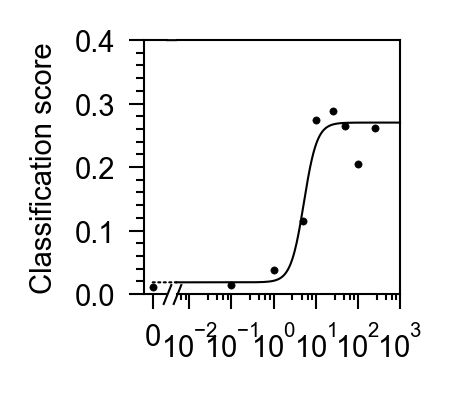

In [44]:
plt.rcParams['font.size']=7

# x  300 mL per 1000g * 1000uM / nM


od = 4
vol = 300
cfu_per_ml_per_od = 1.044e9
cfu = cfu_per_ml_per_od * od * vol
area = .35*.3 #cm^2
mass = 1000

cfu = area * cfu / (mass)

s = np.array(mean_scores) #/ cfu  * area 

print ("Saved to:", f'{savedir}/{date_str}_col1_insitu_RG_classified_hill_plot.pdf')

# what are these concentrations?
concs_transformed = conc_map.loc[:,0].values #* 300e-3 / 1000 * 1000

plot_fit_curve(concs_transformed,
                   s,
                   hill_eqn, 
                   [0.5e-2,1e3],
                   [-0.,0.4],
                   f'{savedir}/{date_str}_col1_insitu_RG_classified_hill_plot.pdf',
                   ymax_bound=np.inf,#np.max(s)*3,
                   figsize=(1.1,1.1), markersize=3,
                   x_offset=2e-6, 
                   ylabel = 'Classification score',
                   fit_lower_bounds=[-1,-1,0,0],
                  fit_upper_bounds=[np.inf,0.27,np.inf,2.8],
                  ignore_for_fit = [0,1]
                  )

In [45]:
unnormed_img = np.array(lib.load())
unnormed_peak_of_interest = apply_function_to_rectangles (unnormed_img, zip(rectangle_tls, rectangle_brs), peak_fxn)


[ 0.15893036  0.11659294  0.17969579  0.16096336  0.14957672  0.08340538
  0.04061794  0.00569105  0.        ]
Saved to: 00_data/uav_flight_hsiraw_0_rd_rf_or_outputs_from_analysis//19Aug2024_col1_insitu_RG_classified_hill_plot_unnormed_reflectance_at-866.969.pdf
FITTING
DONE FITTING
~~~
ymax:0.15728759489907668
ymin:0.006956959611598202
K:3.4601179798458013
n:1.543515949056425
~~~


/var/folders/cb/fq3bwnj51bv2d7d694kx77pm0000gp/T/ipykernel_13696/250503391.py:103: UserWarning:

All values for SymLogScale are below linthresh, making it effectively linear. You likely should lower the value of linthresh. 

/var/folders/cb/fq3bwnj51bv2d7d694kx77pm0000gp/T/ipykernel_13696/250503391.py:106: UserWarning:

All values for SymLogScale are below linthresh, making it effectively linear. You likely should lower the value of linthresh. 



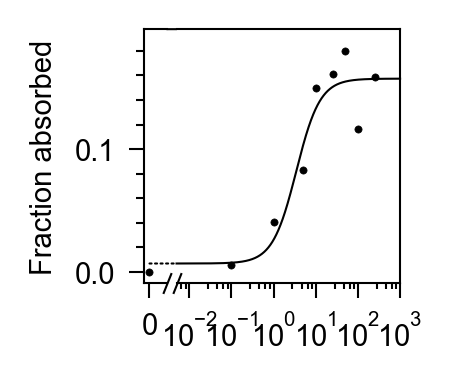

In [46]:
s = 1-np.array(unnormed_peak_of_interest)
 
s = s - np.nanmin(s)
print (s)
savename = f'{savedir}/{date_str}_col1_insitu_RG_classified_hill_plot_unnormed_reflectance_at-{centers[max_abs_idx]}.pdf'
print ("Saved to:", f'{savename}')
plot_fit_curve(conc_map.loc[:,0].values,
                   s,
                   hill_eqn, 
                   [0.5e-2,1e3],
#                    [-np.nanmax(s)*0.01, np.nanmax(s)],
                   [-np.nanmax(s)*0.05,np.nanmax(s)*1.1],
                   savename,
                    line_color = 'black',
                    marker_color='black', edgecolor=None,
                 figsize=(1.1,1.1), markersize=3,x_offset=1e-6, 
                  )

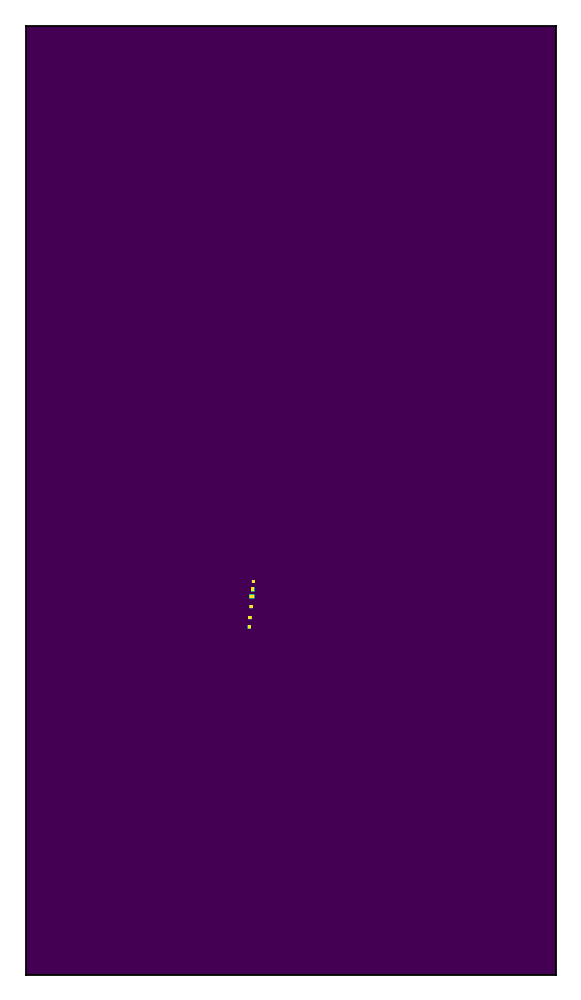

In [47]:
pos_mask_idxs = conc_map.index[conc_map[0]>=5]


mask = make_rectangle_mask(img.shape[:2], zip(np.array(rectangle_tls)[pos_mask_idxs], np.array(rectangle_brs)[pos_mask_idxs]))

plt.figure(dpi=400)
plt.imshow(mask)
plt.xticks([])
plt.yticks([])
plt.show()

(1220, 682, 3) (1220, 682, 1)


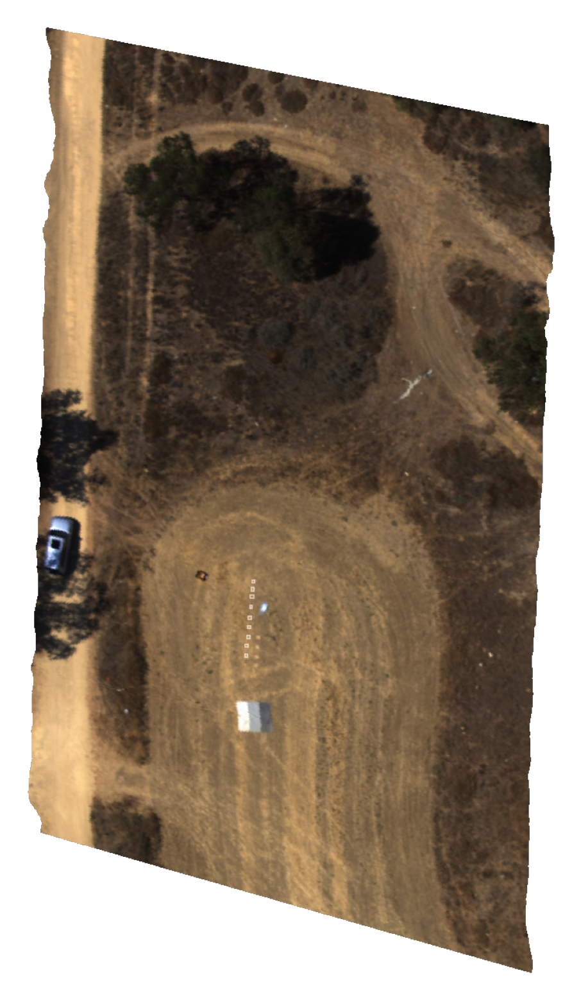

In [48]:
f, ax = plt.subplots(1, dpi=400)

whole_rgb = bandpass_rgb_function(unnormalized_img, centers, coeffs=[1.8,1.8,1.8])

alpha_layer = ((1-np.isnan(img[:,:,0]))[:,:,np.newaxis]*255).astype(int)
print(whole_rgb.shape, alpha_layer.shape)
whole_rgb = np.concatenate([whole_rgb, alpha_layer], axis=2).astype(int)



ax.imshow(whole_rgb/255)

for tl, br in zip(np.array(rectangle_tls)[pos_mask_idxs], np.array(rectangle_brs)[pos_mask_idxs]):
    
    w = br[1] - tl[1]
    h = br[0] - tl[0]
    # Draw white square centered at (x, y)
    square = plt.Rectangle((tl[1], tl[0]), w, h, fill=False, color='white', linewidth=0.4, alpha=0.5)
    ax.add_patch(square)

    
for tl, br in zip(np.array(rectangle_tls[6:9]), np.array(rectangle_brs[6:9])):
    
    w = br[1] - tl[1]
    h = br[0] - tl[0]
    # Draw white square centered at (x, y)
    square = plt.Rectangle((tl[1], tl[0]), w, h, fill=False, color='white', linewidth=0.4, alpha=0.5)
    ax.add_patch(square)
    
plt.xticks([])
plt.yticks([])
plt.box(False)
plt.savefig(f'{savedir}/{date_str}_high-flight_rgb_img_with_rectangles_marked.pdf', transparent=True)

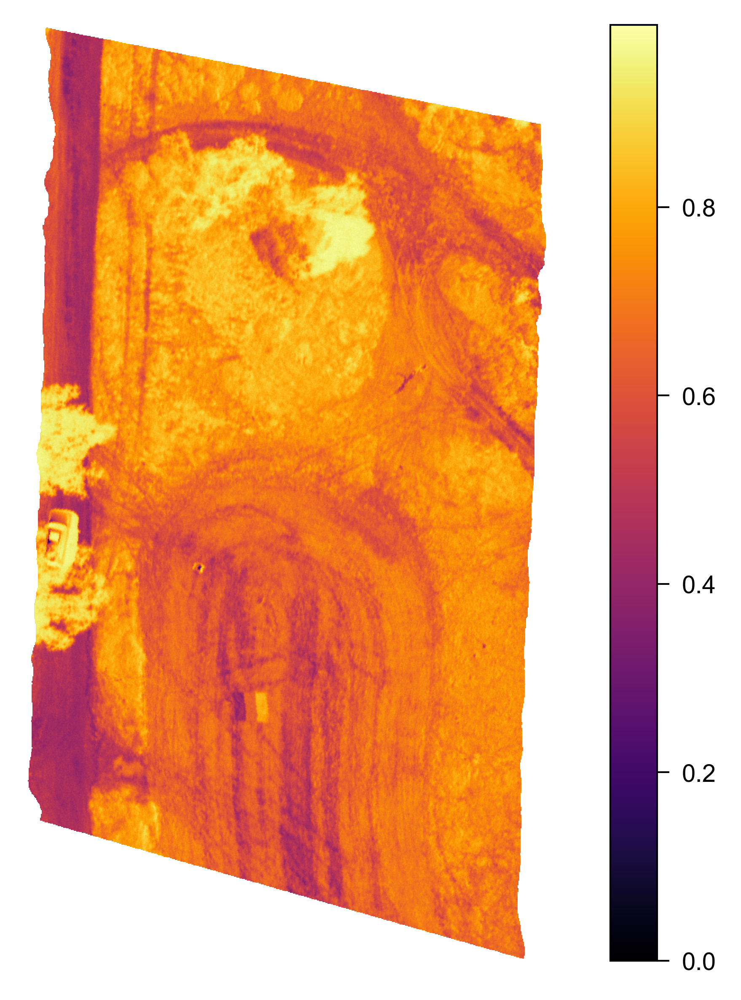

In [49]:
plt.figure(dpi=600)
unnormed_img[unnormed_img==0] = np.nan
plt.imshow(1-unnormed_img[:,:,max_abs_idx], cmap='inferno', vmin=0)
plt.xticks([])
plt.yticks([])
plt.box(False)
plt.colorbar()
plt.savefig(f'{savedir}/unnormalized_image_at-{centers[max_abs_idx]}.png', dpi=400)
plt.show()

[713 291] 3 3
[722 290] 3 5
[732 288] 5 4
[745 288] 3 4
[759 286] 4 4
[771 285] 4 4
[771 285] 4 4
[784 284] 4 4
[795 282] 4 4
[808 282] 3 4


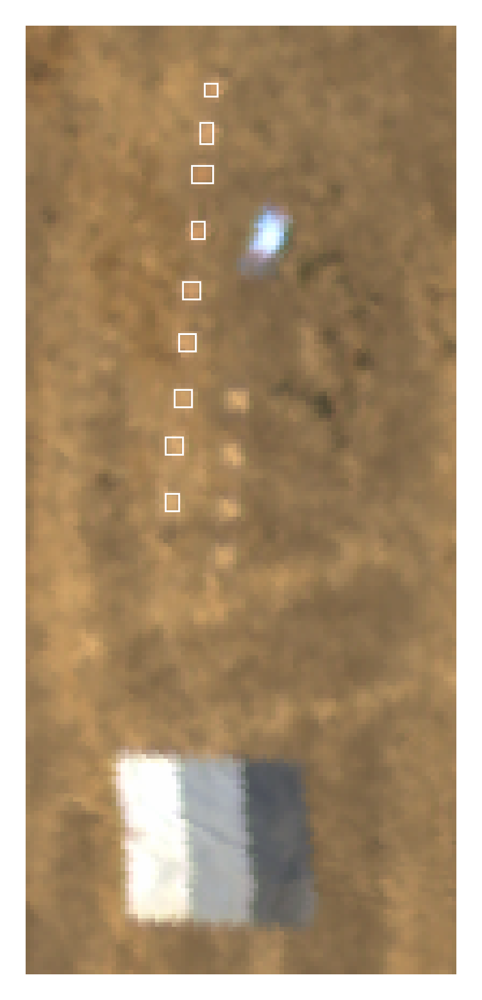

In [50]:
f, ax = plt.subplots(1, dpi=400)


crop = [[700,920], [250,350]]
ax.imshow(whole_rgb[crop[0][0]:crop[0][1], crop[1][0]:crop[1][1]].astype(int))

for tl, br in zip(np.array(rectangle_tls)[pos_mask_idxs], np.array(rectangle_brs)[pos_mask_idxs]):
    
    w = br[1] - tl[1]
    h = br[0] - tl[0]
    print (tl, w,h)
    # Draw white square centered at (x, y)
    square = plt.Rectangle((tl[1]-crop[1][0], tl[0]-crop[0][0]), w, h, fill=False, color='white', linewidth=0.5)
    ax.add_patch(square)

    
for tl, br in zip(np.array(rectangle_tls[5:9]), np.array(rectangle_brs[5:9])):
    
    w = br[1] - tl[1]
    h = br[0] - tl[0]
    print (tl, w,h)
    # Draw white square centered at (x, y)
    square = plt.Rectangle((tl[1]-crop[1][0], tl[0]-crop[0][0]), w, h, fill=False, color='white', linewidth=0.5)
    ax.add_patch(square)
    
plt.xticks([])
plt.yticks([])
plt.box(False)
plt.savefig(f'{savedir}/{date_str}_MAFAT_high_flight_rgb_img_with_rectangles_marked_cropped.pdf', dpi=300)

In [51]:
whole_rgb = bandpass_rgb_function(unnormalized_img, centers, coeffs=[1.8,1.8,1.8]).astype(np.float64)
alpha_layer = (1-np.isnan(img[:,:,0])).astype(np.float64)[:,:,np.newaxis]
print(whole_rgb.shape, alpha_layer.shape)
whole_rgb = np.concatenate([whole_rgb, alpha_layer], axis=2)
print (whole_rgb.shape)

(1220, 682, 3) (1220, 682, 1)
(1220, 682, 4)


In [52]:
#label as "positive" the pixels within the rectangles of 10^1 and above? 

image_y = flatten_array(mask)

class 0.98457673028
abs 0.247239848513


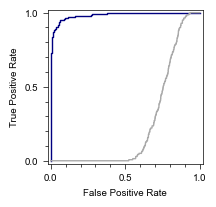

In [53]:
# import numpy as np
from sklearn.metrics import roc_curve, auc

y_scores = flatten_array(scored_img.copy())
y_true = image_y.copy()
y_abs = 1-flatten_array(unnormed_img[:,:,np.argmax(reference_spec)])


y_true = y_true[~np.isnan(y_scores)]
y_abs = y_abs[~np.isnan(y_scores)]
y_scores = y_scores[~np.isnan(y_scores)]



# Compute ROC curve and ROC area
fpr, tpr, thresholds = roc_curve(y_true, y_scores)
class_roc_auc = auc(fpr, tpr)


abs_fpr, abs_tpr, abs_thresholds = roc_curve(y_true, y_abs)
abs_roc_auc =  auc(abs_fpr, abs_tpr)

# Plotting the ROC curve
plt.figure(figsize=(2,2))
plt.plot(fpr, tpr, color='navy', lw=1, label='ROC curve (area = %0.2f)' % class_roc_auc)
print ('class', class_roc_auc)
plt.plot(abs_fpr, abs_tpr, color='darkgray', lw=1, label='ROC curve (area = %0.2f)' % abs_roc_auc)
print ('abs', abs_roc_auc)
# plt.plot([0, 1], [0, 1], color='black', lw=1, linestyle='--')
plt.xlim([-0.02, 1.02])
plt.ylim([-0.02, 1.02])
plt.xticks([0,0.5,1])
plt.yticks([0,0.5,1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# plt.legend(loc="lower right")
plt.minorticks_on()
plt.savefig(f'{savedir}/{date_str}_classification_ROC_curve.pdf')
plt.show()

In [54]:
if not os.path.isdir(f'{savedir}/roc_supp/'):
    os.mkdir(f'{savedir}/roc_supp/')
    print (f'Made directory: {savedir}/roc_supp/')
    
from matplotlib.colors import ListedColormap
cmap = ListedColormap(["whitesmoke", "crimson"])

figsize = (img.shape[1]/300, img.shape[0]/300)

Made directory: 00_data/uav_flight_hsiraw_0_rd_rf_or_outputs_from_analysis//roc_supp/


In [56]:
crop2 = crop

crop2 = [[crop2[0][0],
          crop2[0][1]-100], 
          [crop2[1][0]+20,
           crop2[1][1]-45]
        ]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[713 291] 3 3
[722 290] 3 5
[732 288] 5 4
[745 288] 3 4
[759 286] 4 4
[771 285] 4 4
[771 285] 4 4
[784 284] 4 4
[795 282] 4 4
[808 282] 3 4


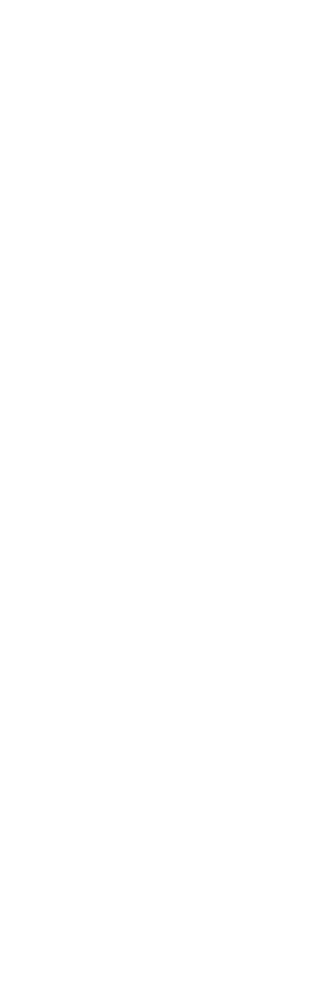

In [57]:
f, ax = plt.subplots(1, dpi=400)


# crop = [[650,900], [250,350]]
ax.imshow(whole_rgb[crop2[0][0]:crop2[0][1], crop2[1][0]:crop2[1][1]])

for tl, br in zip(np.array(rectangle_tls)[pos_mask_idxs], np.array(rectangle_brs)[pos_mask_idxs]):
    
    w = br[1] - tl[1]
    h = br[0] - tl[0]
    print (tl, w,h)
    # Draw white square centered at (x, y)
    square = plt.Rectangle((tl[1]-crop2[1][0], tl[0]-crop2[0][0]), w, h, fill=False, color='white', linewidth=0.5)
    ax.add_patch(square)

    
for tl, br in zip(np.array(rectangle_tls[5:9]), np.array(rectangle_brs[5:9])):
    
    w = br[1] - tl[1]
    h = br[0] - tl[0]
    print (tl, w,h)
    # Draw white square centered at (x, y)
    square = plt.Rectangle((tl[1]-crop2[1][0], tl[0]-crop2[0][0]), w, h, fill=False, color='white', linewidth=0.5)
    ax.add_patch(square)
    
plt.xticks([])
plt.yticks([])
plt.box(False)
plt.savefig(f'{savedir}/{date_str}_MAFAT_high_flight_rgb_img_with_rectangles_marked_cropped_smaller.pdf', dpi=300)

[713 291] 3 3
[722 290] 3 5
[732 288] 5 4
[745 288] 3 4
[759 286] 4 4
[771 285] 4 4
[771 285] 4 4
[784 284] 4 4
[795 282] 4 4
[808 282] 3 4


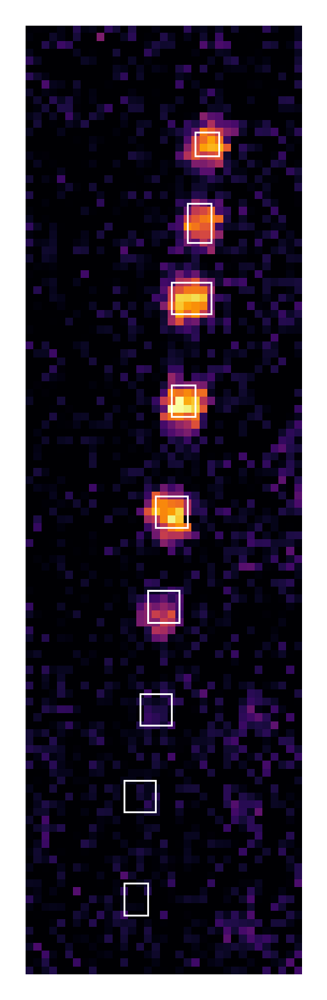

In [58]:
f, ax = plt.subplots(1, dpi=400)


# crop = [[650,900], [250,350]]
ax.imshow(scored_img[crop2[0][0]:crop2[0][1], crop2[1][0]:crop2[1][1]], vmax=0.4, cmap='inferno')

for tl, br in zip(np.array(rectangle_tls)[pos_mask_idxs], np.array(rectangle_brs)[pos_mask_idxs]):
    
    w = br[1] - tl[1]
    h = br[0] - tl[0]
    print (tl, w,h)
    # Draw white square centered at (x, y)
    square = plt.Rectangle((tl[1]-crop2[1][0], tl[0]-crop2[0][0]), w, h, fill=False, color='white', linewidth=0.5)
    ax.add_patch(square)

    
for tl, br in zip(np.array(rectangle_tls[5:9]), np.array(rectangle_brs[5:9])):
    
    w = br[1] - tl[1]
    h = br[0] - tl[0]
    print (tl, w,h)
    # Draw white square centered at (x, y)
    square = plt.Rectangle((tl[1]-crop2[1][0], tl[0]-crop2[0][0]), w, h, fill=False, color='white', linewidth=0.5)
    ax.add_patch(square)
    
plt.xticks([])
plt.yticks([])
plt.box(False)
plt.savefig(f'{savedir}/{date_str}_MAFAT_high_flight_scored_img_with_rectangles_marked_cropped_smaller.pdf', dpi=300)

[713 291] 3 3
[722 290] 3 5
[732 288] 5 4
[745 288] 3 4
[759 286] 4 4
[771 285] 4 4
[771 285] 4 4
[784 284] 4 4
[795 282] 4 4
[808 282] 3 4


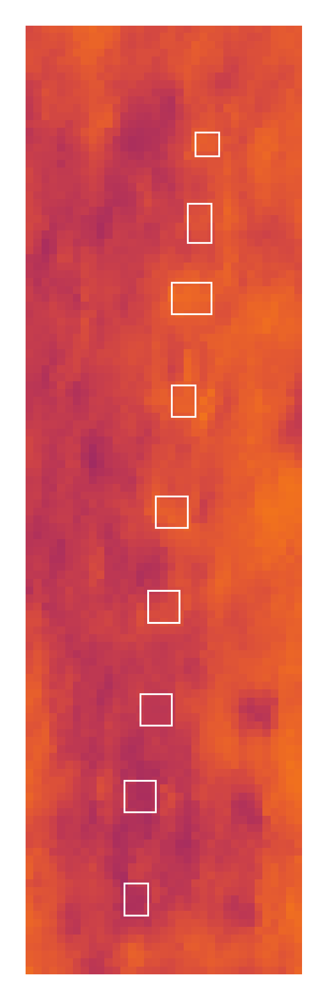

In [59]:
f, ax = plt.subplots(1, dpi=400)


# crop = [[650,900], [250,350]]
ax.imshow(1-unnormalized_img[crop2[0][0]:crop2[0][1], crop2[1][0]:crop2[1][1], np.argmax(reference_spec)], vmin=0, vmax=1, cmap='inferno')

for tl, br in zip(np.array(rectangle_tls)[pos_mask_idxs], np.array(rectangle_brs)[pos_mask_idxs]):
    
    w = br[1] - tl[1]
    h = br[0] - tl[0]
    print (tl, w,h)
    # Draw white square centered at (x, y)
    square = plt.Rectangle((tl[1]-crop2[1][0], tl[0]-crop2[0][0]), w, h, fill=False, color='white', linewidth=0.5)
    ax.add_patch(square)

    
for tl, br in zip(np.array(rectangle_tls[5:9]), np.array(rectangle_brs[5:9])):
    
    w = br[1] - tl[1]
    h = br[0] - tl[0]
    print (tl, w,h)
    # Draw white square centered at (x, y)
    square = plt.Rectangle((tl[1]-crop2[1][0], tl[0]-crop2[0][0]), w, h, fill=False, color='white', linewidth=0.5)
    ax.add_patch(square)
    
plt.xticks([])
plt.yticks([])
plt.box(False)
plt.savefig(f'{savedir}/{date_str}_high_flight_maxabs_img_with_rectangles_marked_cropped_smaller.pdf', dpi=300)

fpr: 0.6907184908935252, tpr: 0.2571428571428571, thresh: 0.6444495916366577
00_data/uav_flight_hsiraw_0_rd_rf_or_outputs_from_analysis//roc_supp/target_tpr_abs_thresh_img_fpr-0.691_tpr-0.257_thresh-0.64.pdf


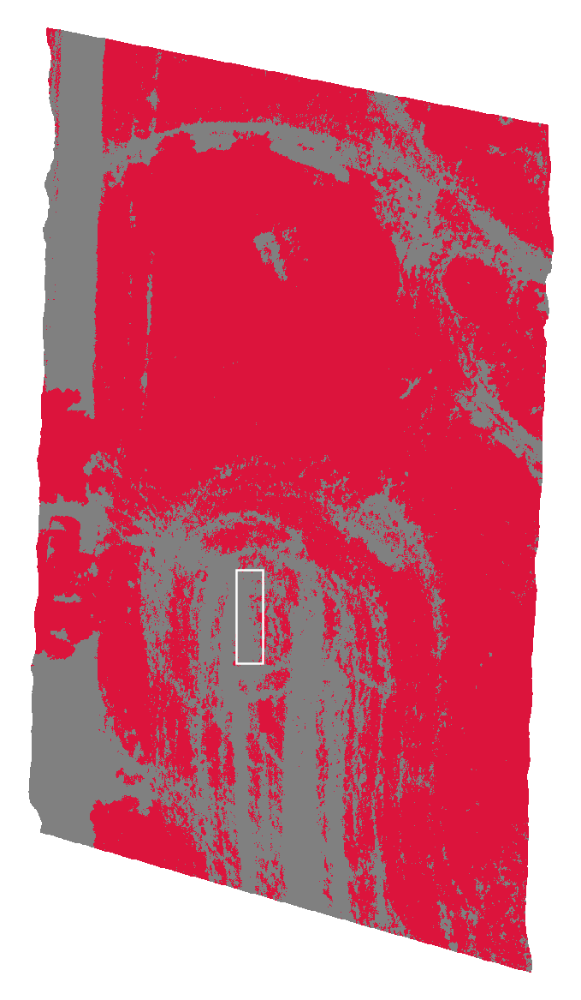

fpr: 0.7536751339877329, tpr: 0.5, thresh: 0.6240952014923096
00_data/uav_flight_hsiraw_0_rd_rf_or_outputs_from_analysis//roc_supp/target_tpr_abs_thresh_img_fpr-0.754_tpr-0.500_thresh-0.62.pdf


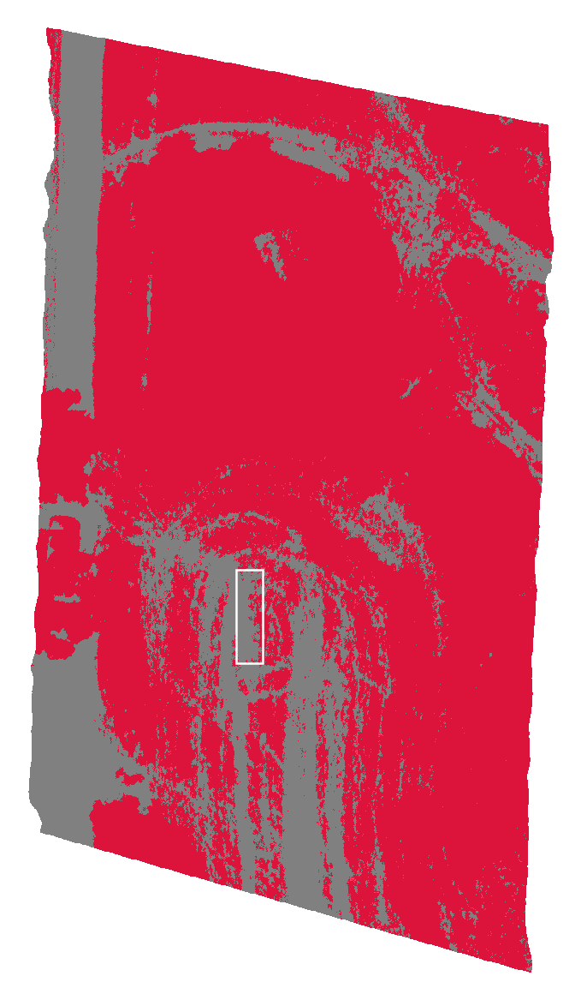

fpr: 0.823508543550411, tpr: 0.75, thresh: 0.5952160358428955
00_data/uav_flight_hsiraw_0_rd_rf_or_outputs_from_analysis//roc_supp/target_tpr_abs_thresh_img_fpr-0.824_tpr-0.750_thresh-0.60.pdf


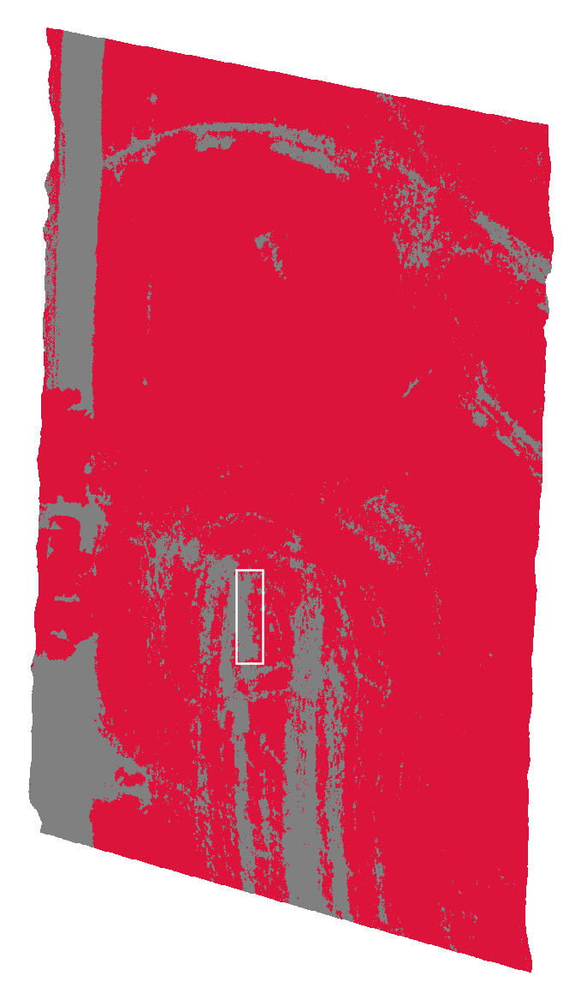

fpr: 0.9265911409773775, tpr: 0.9928571428571429, thresh: 0.5101732015609741
00_data/uav_flight_hsiraw_0_rd_rf_or_outputs_from_analysis//roc_supp/target_tpr_abs_thresh_img_fpr-0.927_tpr-0.993_thresh-0.51.pdf


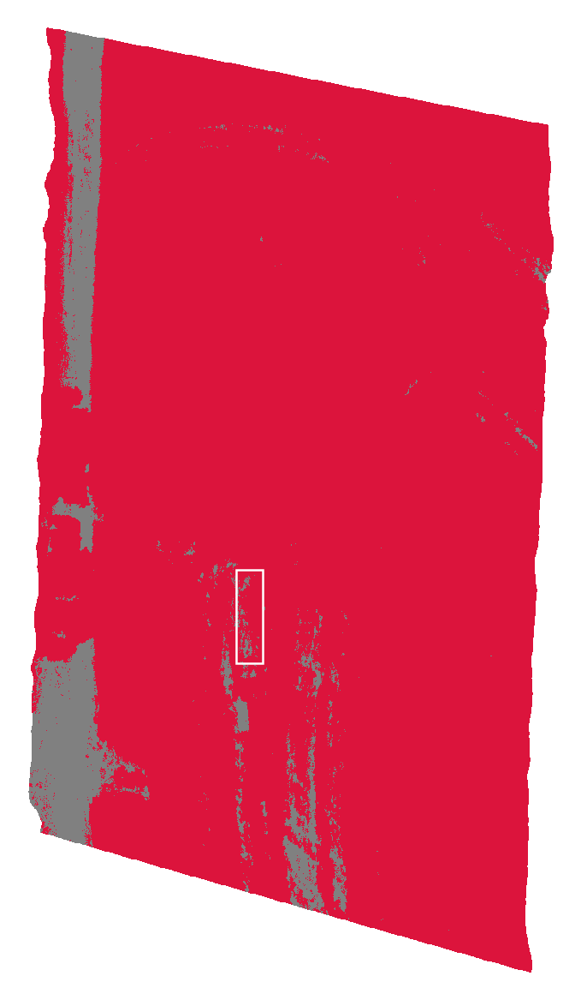

fpr: 0.00031371307274625013, tpr: 0.25, thresh: 0.28768440688718233
00_data/uav_flight_hsiraw_0_rd_rf_or_outputs_from_analysis//roc_supp/target_tpr_scored_thresh_img_fpr-0.000_tpr-0.250_thresh-0.29.pdf


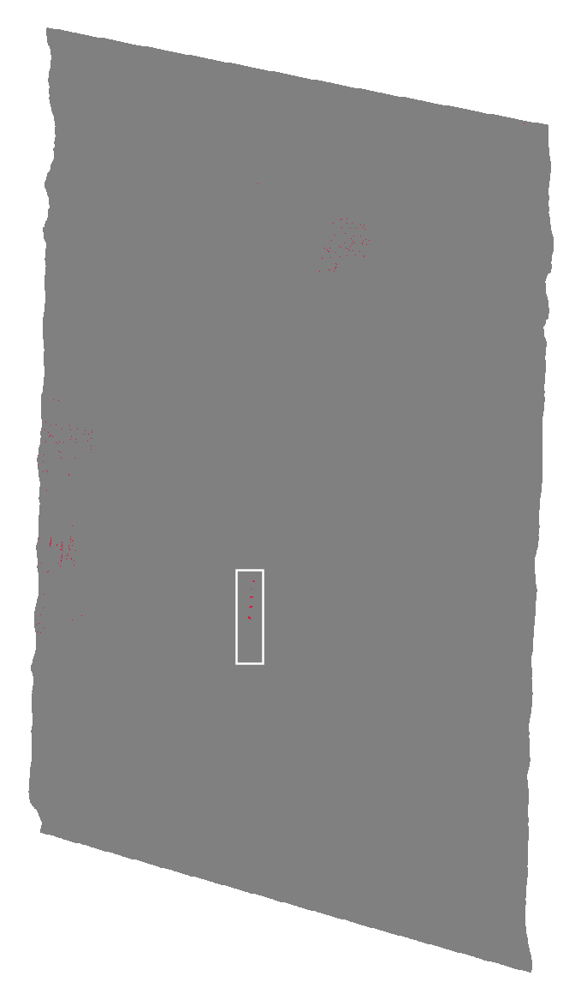

fpr: 0.0008678417713354208, tpr: 0.5, thresh: 0.22921604396679707
00_data/uav_flight_hsiraw_0_rd_rf_or_outputs_from_analysis//roc_supp/target_tpr_scored_thresh_img_fpr-0.001_tpr-0.500_thresh-0.23.pdf


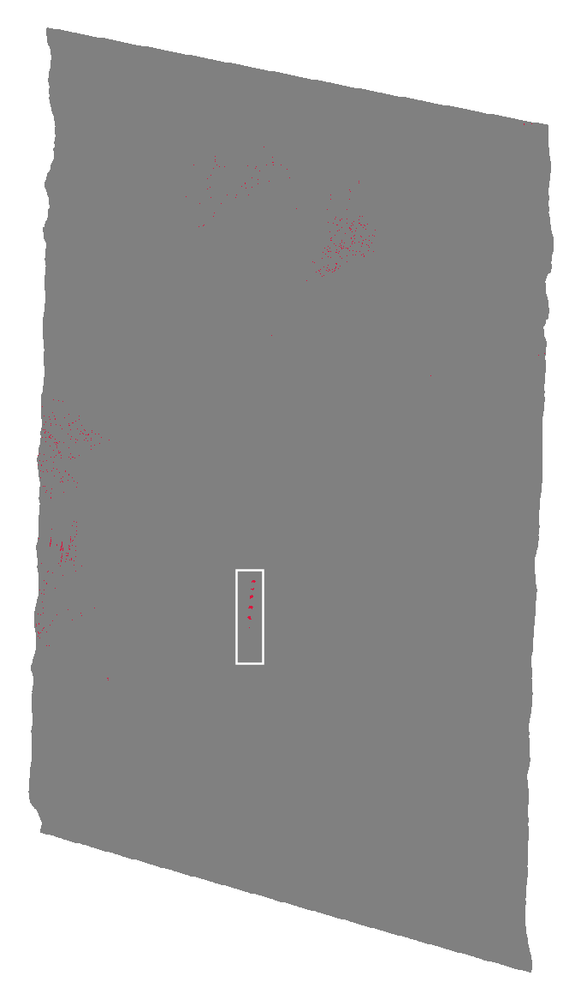

fpr: 0.0053375200835004515, tpr: 0.75, thresh: 0.14509526876652323
00_data/uav_flight_hsiraw_0_rd_rf_or_outputs_from_analysis//roc_supp/target_tpr_scored_thresh_img_fpr-0.005_tpr-0.750_thresh-0.15.pdf


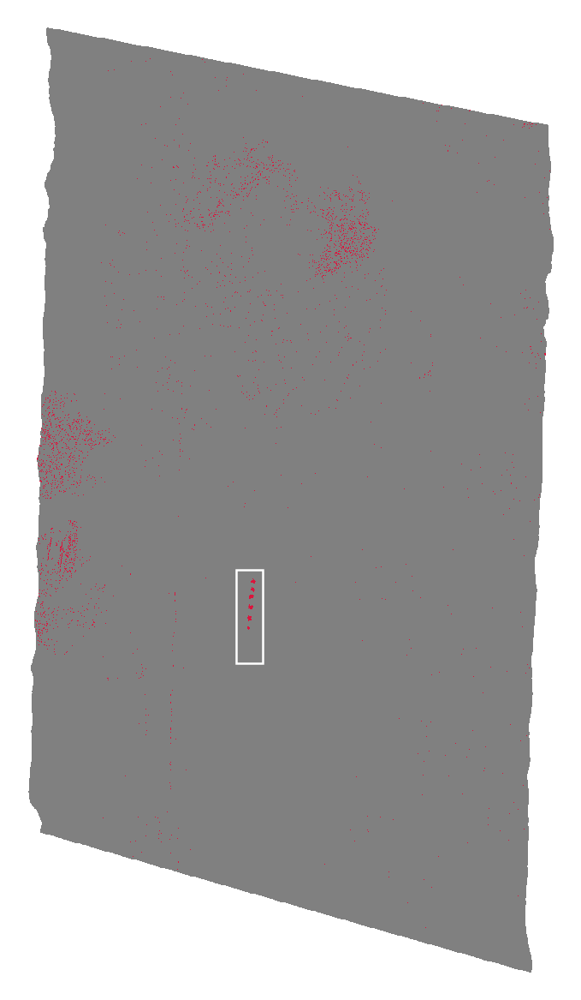

fpr: 0.27351821881340227, tpr: 0.9928571428571429, thresh: 0.024755353442270867
00_data/uav_flight_hsiraw_0_rd_rf_or_outputs_from_analysis//roc_supp/target_tpr_scored_thresh_img_fpr-0.274_tpr-0.993_thresh-0.02.pdf


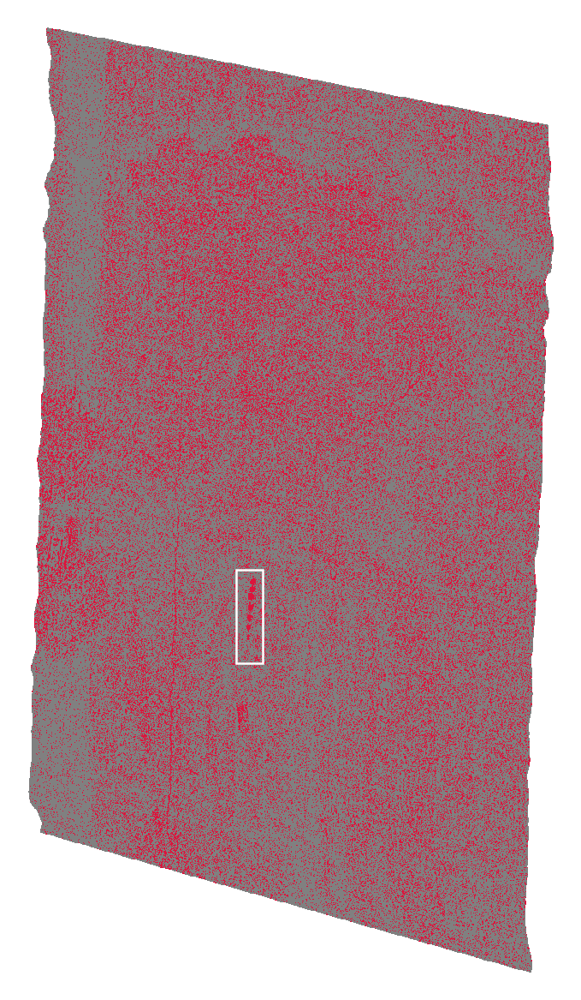

In [60]:
cmap = ListedColormap(["gray", "crimson"])

def binarize (arr, thresh):
    arr = arr.copy()
    arr[arr<thresh] = 0
    arr[arr>thresh] = 1 
    return arr.astype(bool)


figsize = (img.shape[1]/300, img.shape[0]/300)

target_tpr_ls = [0.25,0.5, 0.75, 0.99] #np.linspace(0,1,21)
text_for_fig = ''

nanmask = img[:,:,max_abs_idx].copy()
nanmask[~np.isnan(nanmask)] = 1


for t in target_tpr_ls:
    thresh_idx = np.argmin(np.abs(abs_tpr-t))
    abs_set_thresh = abs_thresholds[thresh_idx]
    savename = f'{savedir}/roc_supp/'+'target_tpr_abs_thresh_img_fpr-{:.3f}_tpr-{:.3f}_thresh-{:.2f}.pdf'.format(abs_fpr[thresh_idx], abs_tpr[thresh_idx], abs_set_thresh)
    print (f'fpr: {abs_fpr[thresh_idx]}, tpr: {abs_tpr[thresh_idx]}, thresh: {abs_set_thresh}')

    
    plt.figure(figsize=figsize, dpi=300)
    plt.imshow(binarize(1-unnormed_img[:,:,max_abs_idx], abs_set_thresh).astype(float)*nanmask, cmap=cmap, vmin=0, vmax=1, 
               aspect='equal', interpolation='none')
    
    
        
    plt.xticks([])
    plt.yticks([])
    plt.box(False)
    plt.tight_layout()
    
#     plt.savefig(savename.replace('.pdf', '.png'), dpi=300, transparent=True)
    
    # draw rectangle
#     for tl, br in zip(np.array(rectangle_tls[:9]), np.array(rectangle_brs[:9])):
#         w = br[1] - tl[1]
#         h = br[0] - tl[0]
#         square = plt.Rectangle((tl[1], tl[0]), w, h, fill=False, color='black', linewidth=0.4, alpha=1)

    w = crop2[1][1]-crop2[1][0]
    h = crop2[0][1]-crop2[0][0]
    square = plt.Rectangle((crop2[1][0], crop2[0][0]), w, h, fill=False, color='white', linewidth=0.6, alpha=1)
    plt.gca().add_patch(square)

    
    print (savename)
    plt.tight_layout()

    plt.savefig(savename, dpi=300)
    plt.show()
    
    text_for_fig += '{:.3f}\n{:.3f}\n{:.3f}\n\n'.format(abs_tpr[thresh_idx], abs_fpr[thresh_idx], abs_set_thresh)
    
for t in target_tpr_ls:
    thresh_idx = np.argmin(np.abs(tpr-t))
    score_set_thresh = thresholds[thresh_idx]
    savename = f'{savedir}/roc_supp/'+'target_tpr_scored_thresh_img_fpr-{:.3f}_tpr-{:.3f}_thresh-{:.2f}.pdf'.format(fpr[thresh_idx], tpr[thresh_idx], score_set_thresh)
    
    print (f'fpr: {fpr[thresh_idx]}, tpr: {tpr[thresh_idx]}, thresh: {score_set_thresh}')
    
    
    plt.figure(figsize=figsize, dpi=300)
    
    plt.imshow(binarize(scored_img, score_set_thresh).astype(float)*nanmask, cmap=cmap, vmin=0, vmax=1, 
               aspect='equal', interpolation='none')
    
    plt.xticks([])
    plt.yticks([])
    plt.box(False)
    plt.tight_layout()
    
#     plt.savefig(savename.replace('.pdf', '.png'), dpi=300, transparent=True)
    # draw rectangle
#     for tl, br in zip(np.array(rectangle_tls[:9]), np.array(rectangle_brs[:9])):
#         w = br[1] - tl[1]
#         h = br[0] - tl[0]
#         square = plt.Rectangle((tl[1], tl[0]), w, h, fill=False, color='black', linewidth=0.4, alpha=1)

    w = crop2[1][1]-crop2[1][0]
    h = crop2[0][1]-crop2[0][0]

    square = plt.Rectangle((crop2[1][0], crop2[0][0]), w, h, fill=False, color='white', linewidth=0.6, alpha=1)
    plt.gca().add_patch(square)
    

    
    print (savename)
    plt.tight_layout()

    plt.savefig(savename, dpi=300)
    
    plt.show()
    
    text_for_fig += '{:.3f}\n{:.3f}\n{:.3f}\n\n'.format(tpr[thresh_idx], fpr[thresh_idx], score_set_thresh)